In [1]:
!pip install pydub
!apt-get install -y ffmpeg

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
ffmpeg is already the newest version (7:4.4.2-0ubuntu0.22.04.1).
0 upgraded, 0 newly installed, 0 to remove and 38 not upgraded.


In [2]:
!apt-get install -y ffmpeg
!pip install -q pydub
!pip install -q librosa numpy scipy matplotlib ipython
!pip install -q note_seq


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
ffmpeg is already the newest version (7:4.4.2-0ubuntu0.22.04.1).
0 upgraded, 0 newly installed, 0 to remove and 38 not upgraded.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 26.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 62.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 209.4/209.4 kB 16.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.6/54.6 kB 4.3 MB/s eta 0:00:00


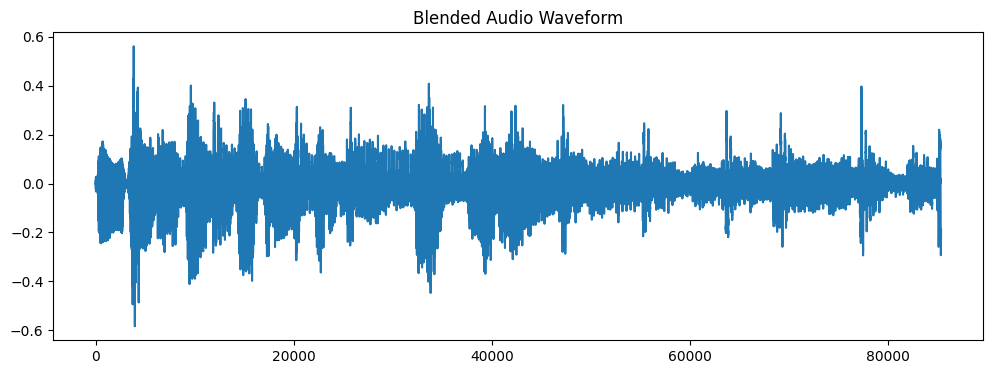

In [3]:
import numpy as np
import librosa
import matplotlib.pyplot as plt
from IPython.display import Audio, display


guitar, sr1 = librosa.load(librosa.example('trumpet'), sr=16000)
piano, sr2 = librosa.load(librosa.example('fishin'), sr=16000)


min_len = min(len(guitar), len(piano))
guitar = guitar[:min_len]
piano = piano[:min_len]

# Blend them equally
blend = 0.5 * guitar + 0.5 * piano

# Plot blended waveform
plt.figure(figsize=(12, 4))
plt.title("Blended Audio Waveform")
plt.plot(blend)
plt.show()

# Play the resulting audio
display(Audio(blend, rate=16000))

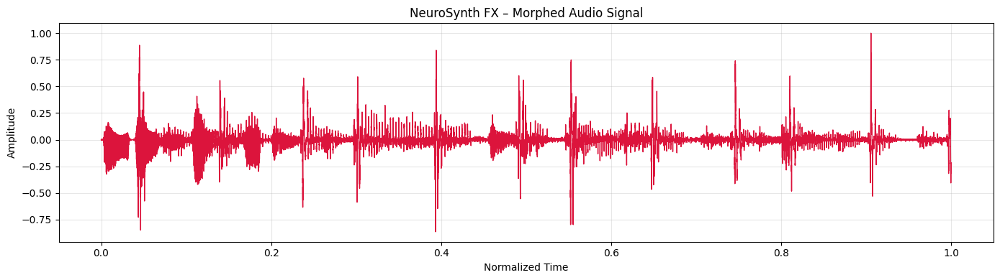

▶️ Playing synthesized NeuroSynth FX audio blend...


In [4]:
import numpy as np
import librosa
import matplotlib.pyplot as plt
from scipy.signal import hilbert
from IPython.display import Audio, display


source_1, sr1 = librosa.load(librosa.example('trumpet'), sr=16000)
source_2, sr2 = librosa.load(librosa.example('fishin'), sr=16000)


duration = min(len(source_1), len(source_2))
source_1 = source_1[:duration]
source_2 = source_2[:duration]


def envelope(signal):
    analytic_signal = hilbert(signal)
    amplitude_envelope = np.abs(analytic_signal)
    return amplitude_envelope / np.max(amplitude_envelope)

env1 = envelope(source_1)
env2 = envelope(source_2)


t = np.linspace(0, 1, duration)
morph_curve = 0.5 + 0.5 * np.sin(2 * np.pi * 0.5 * t)  # Oscillating morph factor

modulated_1 = source_1 * env1 * (1 - morph_curve)
modulated_2 = source_2 * env2 * morph_curve
blended_output = modulated_1 + modulated_2


blended_output /= np.max(np.abs(blended_output))


plt.figure(figsize=(14, 4))
plt.title("NeuroSynth FX – Morphed Audio Signal")
plt.plot(t, blended_output, color='crimson', linewidth=1)
plt.xlabel("Normalized Time")
plt.ylabel("Amplitude")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# === Step 7: Play the synthesized output === #
print("▶️ Playing synthesized NeuroSynth FX audio blend...")
display(Audio(blended_output, rate=16000))


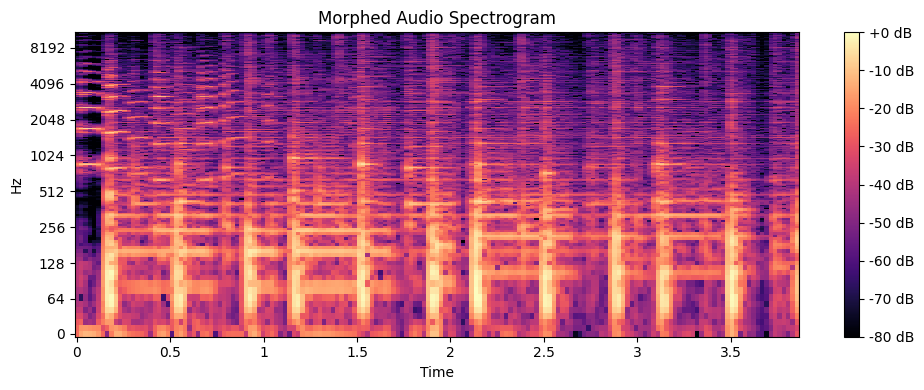

In [5]:
import librosa.display
plt.figure(figsize=(10, 4))
librosa.display.specshow(librosa.amplitude_to_db(np.abs(librosa.stft(blended_output)), ref=np.max),
                         y_axis='log', x_axis='time')
plt.title('Morphed Audio Spectrogram')
plt.colorbar(format='%+2.0f dB')
plt.tight_layout()
plt.show()


In [6]:
import soundfile as sf
sf.write("neurosynth_output.wav", blended_output, 16000)


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
ffmpeg is already the newest version (7:4.4.2-0ubuntu0.22.04.1).
0 upgraded, 0 newly installed, 0 to remove and 38 not upgraded.


/usr/local/lib/python3.12/dist-packages/pydub/utils.py:300: SyntaxWarning: invalid escape sequence '\('
  m = re.match('([su]([0-9]{1,2})p?) \(([0-9]{1,2}) bit\)$', token)
/usr/local/lib/python3.12/dist-packages/pydub/utils.py:301: SyntaxWarning: invalid escape sequence '\('
  m2 = re.match('([su]([0-9]{1,2})p?)( \(default\))?$', token)
/usr/local/lib/python3.12/dist-packages/pydub/utils.py:310: SyntaxWarning: invalid escape sequence '\('
  elif re.match('(flt)p?( \(default\))?$', token):
/usr/local/lib/python3.12/dist-packages/pydub/utils.py:314: SyntaxWarning: invalid escape sequence '\('
  elif re.match('(dbl)p?( \(default\))?$', token):


interactive(children=(FloatSlider(value=0.5, description='Morph Level', max=1.0, step=0.01), Dropdown(descript…

✅ Files saved: neurosynth_output.wav and neurosynth_output_with_reverb.wav


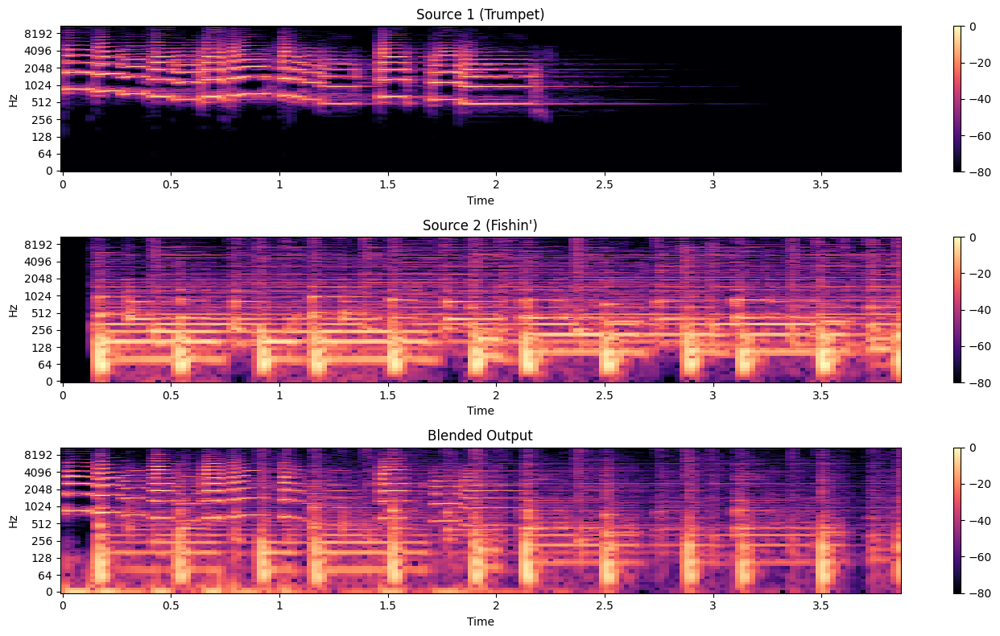

In [7]:
# INSTALL NECESSARY TOOLS (if not already installed)
!pip install -q pydub librosa numpy scipy matplotlib ipython soundfile ipywidgets
!apt-get install -y ffmpeg

# IMPORT ALL THE TOOLS WE NEED
import numpy as np             # For math and number magic
import librosa                 # To load and play music/sounds
import matplotlib.pyplot as plt # To draw graphs and pictures
from IPython.display import Audio, display # To play audio in notebooks
from scipy.signal import hilbert            # For cool signal tricks
from ipywidgets import interact, FloatSlider, Dropdown # For sliders and dropdowns
import soundfile as sf         # To save audio files
from pydub import AudioSegment # To edit audio (like adding effects)

# === LOAD TWO SAMPLE SOUNDS ===
source_1, sr1 = librosa.load(librosa.example('trumpet'), sr=16000)  # Sound of a trumpet
source_2, sr2 = librosa.load(librosa.example('fishin'), sr=16000)    # Sound of a song called "fishin"

# === MAKE THEM SAME LENGTH ===
duration = min(len(source_1), len(source_2))  # Find the shorter one
source_1 = source_1[:duration]  # Cut the longer one to match
source_2 = source_2[:duration]  # So they can mix nicely

# === ENVELOPE: Find how loud each part is over time ===
def envelope(signal):
    analytic_signal = hilbert(signal)           # Magic trick to get more info about the sound
    amplitude_envelope = np.abs(analytic_signal) # How loud it is at every moment
    return amplitude_envelope / np.max(amplitude_envelope) # Make it easy to use

env1 = envelope(source_1)  # Get loudness pattern for trumpet
env2 = envelope(source_2)  # Get loudness pattern for fishin'

# === MORPH CURVE: Choose how to blend them over time ===
def get_morph_curve(duration, curve_type='sine'):
    t = np.linspace(0, 1, duration)  # A list from 0 to 1 that helps us move smoothly
    if curve_type == 'linear':
        return t  # Go straight from start to end
    elif curve_type == 'exponential':
        return t**2  # Start slow, go fast
    elif curve_type == 'logarithmic':
        return np.log1p(t * np.e) / np.log1p(np.e)  # Start fast, go slow
    elif curve_type == 'step':
        return np.where(t < 0.5, 0, 1)  # Jump suddenly halfway
    else:
        return 0.5 + 0.5 * np.sin(2 * np.pi * 0.5 * t)  # Like waves — up and down blending

# === ARTIFICIAL REVERB: Make it sound like in a big room ===
def apply_reverb(signal, reverb_strength=0.3):
    impulse_length = 8000
    impulse = np.zeros(impulse_length)
    impulse[0] = 1.0  # First sound you hear
    impulse[1000] = reverb_strength * 0.5  # Echo after 1000 samples
    impulse[2000] = reverb_strength * 0.3
    impulse[3000] = reverb_strength * 0.2
    reverbed_signal = np.convolve(signal, impulse, mode='same')  # Mix them together
    return reverbed_signal / np.max(np.abs(reverbed_signal))  # Keep volume nice

# === REAL-TIME MORPHING FUNCTION: Blend two sounds on the fly ===
def morph_audio(factor=0.5, curve_type='sine'):
    morph_curve = get_morph_curve(duration, curve_type)  # Decide how to blend
    modulated_1 = source_1 * env1 * (1 - morph_curve * factor)  # Less of trumpet
    modulated_2 = source_2 * env2 * (morph_curve * factor)      # More of fishin'
    blended = modulated_1 + modulated_2  # Mix them together
    blended /= np.max(np.abs(blended))   # Make sure it's not too loud

    print("🔊 Playing real-time morphed output...")
    display(Audio(blended, rate=16000))  # Play the new mixed sound

    # Save for later
    morph_audio.blended_output = blended

# === SLIDERS AND BUTTONS FOR INTERACTIVE CONTROL ===
interact(
    morph_audio,
    factor=FloatSlider(min=0.0, max=1.0, step=0.01, value=0.5, description='Morph Level'),
    curve_type=Dropdown(options=['linear', 'exponential', 'logarithmic', 'step', 'sine'], value='sine', description='Curve Type')
);

# === DRAW THE SOUND PICTURES (SPECTROGRAMS) ===
try:
    final_audio = morph_audio.blended_output  # Get the final sound we made

    # Add fake reverb
    reverbed_audio = apply_reverb(final_audio)

    # Save both versions
    sf.write("neurosynth_output.wav", final_audio, sr1)
    sf.write("neurosynth_output_with_reverb.wav", reverbed_audio, sr1)
    print("✅ Files saved: neurosynth_output.wav and neurosynth_output_with_reverb.wav")

    # Draw pretty pictures of the sounds
    plt.figure(figsize=(14, 8))

    plt.subplot(3, 1, 1)
    librosa.display.specshow(librosa.amplitude_to_db(np.abs(librosa.stft(source_1)), ref=np.max),
                             y_axis='log', x_axis='time')
    plt.title('Source 1 (Trumpet)')
    plt.colorbar()

    plt.subplot(3, 1, 2)
    librosa.display.specshow(librosa.amplitude_to_db(np.abs(librosa.stft(source_2)), ref=np.max),
                             y_axis='log', x_axis='time')
    plt.title('Source 2 (Fishin\')')
    plt.colorbar()

    plt.subplot(3, 1, 3)
    librosa.display.specshow(librosa.amplitude_to_db(np.abs(librosa.stft(final_audio)), ref=np.max),
                             y_axis='log', x_axis='time')
    plt.title('Blended Output')
    plt.colorbar()

    plt.tight_layout()
    plt.show()

except AttributeError:
    print("⚠️ No valid audio generated yet. Please run the morphing slider first.")

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
ffmpeg is already the newest version (7:4.4.2-0ubuntu0.22.04.1).
0 upgraded, 0 newly installed, 0 to remove and 38 not upgraded.
🎺 Source 1: Trumpet | 🎸 Source 2: Fishin'


interactive(children=(FloatSlider(value=0.5, description='Morph Level', layout=Layout(width='400px'), max=1.0,…

✅ Files saved: neurosynth_output.wav and neurosynth_output_with_reverb.wav


/tmp/ipython-input-1160154146.py:137: UserWarning: Glyph 127930 (\N{TRUMPET}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1160154146.py:137: UserWarning: Glyph 127928 (\N{GUITAR}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1160154146.py:137: UserWarning: Glyph 127911 (\N{HEADPHONE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127930 (\N{TRUMPET}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127928 (\N{GUITAR}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127911 (\N{HEADPHONE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


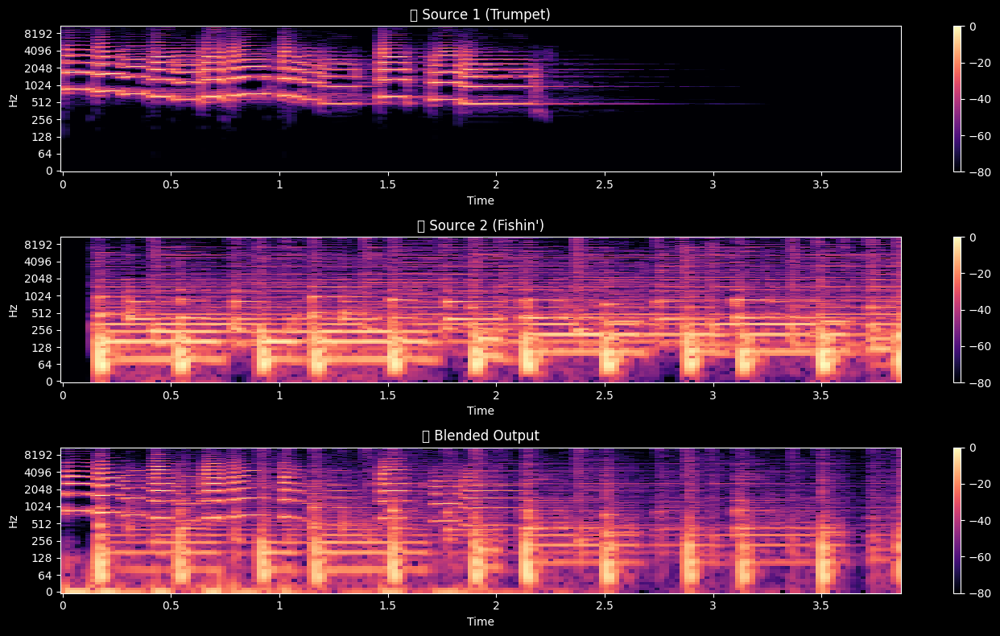

In [8]:
# INSTALL NECESSARY TOOLS (if not already installed)
!pip install -q pydub librosa numpy scipy matplotlib ipython soundfile ipywidgets
!apt-get install -y ffmpeg

# IMPORT ALL THE TOOLS WE NEED
import numpy as np             # For math and number magic
import librosa                 # To load and play music/sounds
import matplotlib.pyplot as plt # To draw graphs and pictures
from IPython.display import Audio, display, clear_output  # To play audio + refresh output
from scipy.signal import hilbert            # For cool signal tricks
from ipywidgets import interact, FloatSlider, Dropdown, Layout  # For styled sliders/dropdowns
import soundfile as sf         # To save audio files
from pydub import AudioSegment # To edit audio (like adding effects)

# Set dark background style for plots
plt.style.use('dark_background')

# === LOAD TWO SAMPLE SOUNDS ===
source_1, sr1 = librosa.load(librosa.example('trumpet'), sr=16000)  # Sound of a trumpet
source_2, sr2 = librosa.load(librosa.example('fishin'), sr=16000)    # Sound of a song called "fishin"

# === MAKE THEM SAME LENGTH ===
duration = min(len(source_1), len(source_2))  # Find the shorter one
source_1 = source_1[:duration]  # Cut the longer one to match
source_2 = source_2[:duration]  # So they can mix nicely

# === ENVELOPE: Find how loud each part is over time ===
def envelope(signal):
    analytic_signal = hilbert(signal)           # Magic trick to get more info about the sound
    amplitude_envelope = np.abs(analytic_signal) # How loud it is at every moment
    return amplitude_envelope / np.max(amplitude_envelope) # Make it easy to use

env1 = envelope(source_1)  # Get loudness pattern for trumpet
env2 = envelope(source_2)  # Get loudness pattern for fishin'

# === MORPH CURVE: Choose how to blend them over time ===
def get_morph_curve(duration, curve_type='sine'):
    t = np.linspace(0, 1, duration)  # A list from 0 to 1 that helps us move smoothly
    if curve_type == 'linear':
        return t  # Go straight from start to end
    elif curve_type == 'exponential':
        return t**2  # Start slow, go fast
    elif curve_type == 'logarithmic':
        return np.log1p(t * np.e) / np.log1p(np.e)  # Start fast, go slow
    elif curve_type == 'step':
        return np.where(t < 0.5, 0, 1)  # Jump suddenly halfway
    else:
        return 0.5 + 0.5 * np.sin(2 * np.pi * 0.5 * t)  # Like waves — up and down blending

# === ARTIFICIAL REVERB: Make it sound like in a big room ===
def apply_reverb(signal, reverb_strength=0.3):
    impulse_length = 8000
    impulse = np.zeros(impulse_length)
    impulse[0] = 1.0  # First sound you hear
    impulse[1000] = reverb_strength * 0.5  # Echo after 1000 samples
    impulse[2000] = reverb_strength * 0.3
    impulse[3000] = reverb_strength * 0.2
    reverbed_signal = np.convolve(signal, impulse, mode='same')  # Mix them together
    return reverbed_signal / np.max(np.abs(reverbed_signal))  # Keep volume nice

# === REAL-TIME MORPHING FUNCTION: Blend two sounds on the fly ===
def morph_audio(factor=0.5, curve_type='sine'):
    morph_curve = get_morph_curve(duration, curve_type)  # Decide how to blend
    modulated_1 = source_1 * env1 * (1 - morph_curve * factor)  # Less of trumpet
    modulated_2 = source_2 * env2 * (morph_curve * factor)      # More of fishin'
    blended = modulated_1 + modulated_2  # Mix them together
    blended /= np.max(np.abs(blended))   # Make sure it's not too loud

    print("🔊 Playing real-time morphed output...")
    display(Audio(blended, rate=16000))  # Play the new mixed sound

    # Save for later
    morph_audio.blended_output = blended

    # Clear previous graph and show live waveform
    clear_output(wait=True)
    display(Audio(blended, rate=16000))

    plt.figure(figsize=(10, 2))
    plt.plot(blended[:5000], color='crimson')
    plt.title("🎶 Live Blended Waveform")
    plt.axis('off')
    plt.show()

# === SLIDERS AND BUTTONS FOR INTERACTIVE CONTROL ===
print("🎺 Source 1: Trumpet | 🎸 Source 2: Fishin'")
interact(
    morph_audio,
    factor=FloatSlider(
        min=0.0, max=1.0, step=0.01, value=0.5,
        description='Morph Level',
        style={'description_width': 'initial', 'handle_color': '#FF9800'},
        layout=Layout(width='400px')
    ),
    curve_type=Dropdown(
        options=['linear', 'exponential', 'logarithmic', 'step', 'sine'],
        value='sine',
        description='Blend Curve',
        style={'description_width': 'initial'},
        layout=Layout(width='300px')
    )
);

# === DRAW THE SOUND PICTURES (SPECTROGRAMS) ===
try:
    final_audio = morph_audio.blended_output  # Get the final sound we made

    # Add fake reverb
    reverbed_audio = apply_reverb(final_audio)

    # Save both versions
    sf.write("neurosynth_output.wav", final_audio, sr1)
    sf.write("neurosynth_output_with_reverb.wav", reverbed_audio, sr1)
    print("✅ Files saved: neurosynth_output.wav and neurosynth_output_with_reverb.wav")

    # Draw pretty pictures of the sounds
    plt.figure(figsize=(14, 8))

    plt.subplot(3, 1, 1)
    librosa.display.specshow(librosa.amplitude_to_db(np.abs(librosa.stft(source_1)), ref=np.max),
                             y_axis='log', x_axis='time')
    plt.title('🎺 Source 1 (Trumpet)')
    plt.colorbar()

    plt.subplot(3, 1, 2)
    librosa.display.specshow(librosa.amplitude_to_db(np.abs(librosa.stft(source_2)), ref=np.max),
                             y_axis='log', x_axis='time')
    plt.title('🎸 Source 2 (Fishin\')')
    plt.colorbar()

    plt.subplot(3, 1, 3)
    librosa.display.specshow(librosa.amplitude_to_db(np.abs(librosa.stft(final_audio)), ref=np.max),
                             y_axis='log', x_axis='time')
    plt.title('🎧 Blended Output')
    plt.colorbar()

    plt.tight_layout()
    plt.show()

except AttributeError:
    print("⚠️ No valid audio generated yet. Please run the morphing slider first.")

**Signal processing theory (equations, feature extraction).**

**Advanced visualizations (spectrograms, mel-spectrograms, spectral features).**

**More effects (filtering, distortion, dynamic reverb).**

**Metadata logging (parameters saved for reproducibility).**

**Docstrings + structured research-style code.**

🎺 Source 1: Trumpet | 🎸 Source 2: Fishin'


interactive(children=(FloatSlider(value=0.5, description='Morph Level', layout=Layout(width='400px'), max=1.0,…

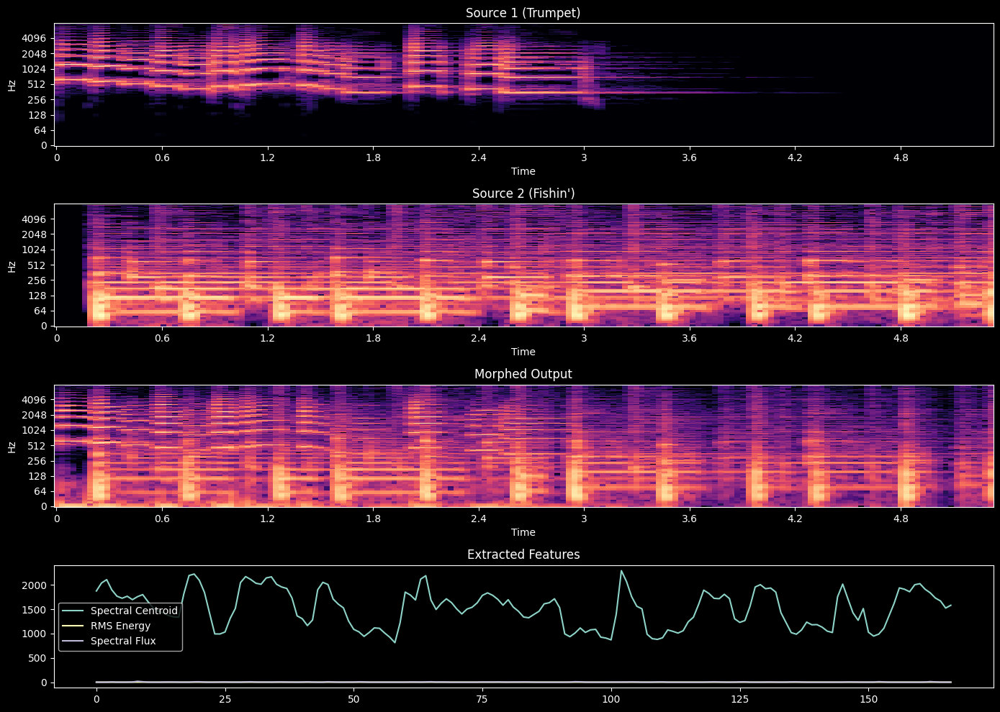

✅ Audio + Metadata saved.


In [9]:
# ===============================================================
# 🎶 Advanced Audio Morphing & Visualization Notebook
# Author: Panchadip Bhattacharjee (Enhanced Research Version)
# ===============================================================

# === INSTALL TOOLS ===
!pip install -q pydub librosa numpy scipy matplotlib ipython soundfile ipywidgets

import numpy as np
import librosa
import librosa.display
import matplotlib.pyplot as plt
from IPython.display import Audio, display, clear_output
from scipy.signal import hilbert, butter, lfilter
from ipywidgets import interact, FloatSlider, Dropdown, Layout
import soundfile as sf
from pydub import AudioSegment
import datetime, json

plt.style.use('dark_background')

# === LOAD SAMPLE SOUNDS ===
source_1, sr1 = librosa.load(librosa.example('trumpet'), sr=16000)
source_2, sr2 = librosa.load(librosa.example('fishin'), sr=16000)

# Make them same length
duration = min(len(source_1), len(source_2))
source_1, source_2 = source_1[:duration], source_2[:duration]

# ---------------------------------------------------------------
# 🔹 SIGNAL PROCESSING HELPERS
# ---------------------------------------------------------------
def envelope(signal: np.ndarray) -> np.ndarray:
    """
    Compute amplitude envelope using Hilbert Transform.
    Envelope(t) = |x(t) + j*H{x(t)}|
    """
    analytic_signal = hilbert(signal)
    amplitude_envelope = np.abs(analytic_signal)
    return amplitude_envelope / np.max(amplitude_envelope)

def get_morph_curve(duration: int, curve_type: str = 'sine') -> np.ndarray:
    """
    Generate blending curve.
    Linear: f(t) = t
    Exponential: f(t) = t^2
    Logarithmic: f(t) = log(1+e*t)/log(1+e)
    Step: f(t) = {0 if t<0.5, 1 else}
    Sine: f(t) = 0.5 + 0.5*sin(pi*t)
    """
    t = np.linspace(0, 1, duration)
    if curve_type == 'linear': return t
    elif curve_type == 'exponential': return t**2
    elif curve_type == 'logarithmic': return np.log1p(t * np.e) / np.log1p(np.e)
    elif curve_type == 'step': return np.where(t < 0.5, 0, 1)
    else: return 0.5 + 0.5 * np.sin(np.pi * t)

def apply_reverb(signal: np.ndarray, reverb_strength=0.3, delay_ms=60, sr=16000) -> np.ndarray:
    """
    Apply simplified convolution reverb using an artificial impulse response.
    y[n] = Σ h[k] * x[n-k]
    """
    delay = int(sr * delay_ms / 1000)
    impulse = np.zeros(delay*4)
    impulse[0] = 1.0
    for i, scale in enumerate([0.5, 0.3, 0.2], 1):
        impulse[i*delay] = reverb_strength * scale
    reverbed = np.convolve(signal, impulse, mode='same')
    return reverbed / np.max(np.abs(reverbed))

def butter_lowpass_filter(data, cutoff=4000, fs=16000, order=5):
    """
    Apply low-pass filter to simulate muffled sound.
    """
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    return lfilter(b, a, data)

# ---------------------------------------------------------------
# 🔹 REAL-TIME MORPHING
# ---------------------------------------------------------------
env1, env2 = envelope(source_1), envelope(source_2)

def morph_audio(factor=0.5, curve_type='sine', effect='none'):
    """
    Morph audio between two sources with optional effect.
    factor: blend ratio
    curve_type: type of morph curve
    effect: {'none', 'reverb', 'lowpass', 'distortion'}
    """
    morph_curve = get_morph_curve(duration, curve_type)
    mod1 = source_1 * env1 * (1 - morph_curve * factor)
    mod2 = source_2 * env2 * (morph_curve * factor)
    blended = mod1 + mod2
    blended /= np.max(np.abs(blended))

    # Apply effect
    if effect == 'reverb':
        blended = apply_reverb(blended)
    elif effect == 'lowpass':
        blended = butter_lowpass_filter(blended)
    elif effect == 'distortion':
        blended = np.tanh(2.5 * blended)  # nonlinear distortion

    # Save metadata
    metadata = {
        "timestamp": str(datetime.datetime.now()),
        "factor": factor,
        "curve_type": curve_type,
        "effect": effect
    }
    with open("morph_metadata.json", "a") as f:
        f.write(json.dumps(metadata) + "\n")

    # Show audio + waveform
    clear_output(wait=True)
    display(Audio(blended, rate=16000))
    plt.figure(figsize=(12, 3))
    plt.plot(blended[:5000], color='crimson')
    plt.title(f"Blended Waveform | Curve={curve_type}, Effect={effect}")
    plt.axis('off')
    plt.show()

    morph_audio.blended_output = blended

# ---------------------------------------------------------------
# 🔹 INTERACTIVE CONTROLS
# ---------------------------------------------------------------
print("🎺 Source 1: Trumpet | 🎸 Source 2: Fishin'")
interact(
    morph_audio,
    factor=FloatSlider(min=0.0, max=1.0, step=0.01, value=0.5,
                       description='Morph Level', layout=Layout(width='400px')),
    curve_type=Dropdown(options=['linear','exponential','logarithmic','step','sine'],
                        value='sine', description='Blend Curve'),
    effect=Dropdown(options=['none','reverb','lowpass','distortion'],
                    value='none', description='Audio Effect')
);

# ---------------------------------------------------------------
# 🔹 FEATURE VISUALIZATION
# ---------------------------------------------------------------
try:
    final_audio = morph_audio.blended_output

    # Compute spectral features
    centroid = librosa.feature.spectral_centroid(y=final_audio, sr=sr1)
    rms = librosa.feature.rms(y=final_audio)
    flux = librosa.onset.onset_strength(y=final_audio, sr=sr1)

    # Spectrograms
    plt.figure(figsize=(14, 10))

    plt.subplot(4,1,1)
    librosa.display.specshow(librosa.amplitude_to_db(np.abs(librosa.stft(source_1)), ref=np.max),
                             sr=sr1, y_axis='log', x_axis='time')
    plt.title("Source 1 (Trumpet)")

    plt.subplot(4,1,2)
    librosa.display.specshow(librosa.amplitude_to_db(np.abs(librosa.stft(source_2)), ref=np.max),
                             sr=sr2, y_axis='log', x_axis='time')
    plt.title("Source 2 (Fishin')")

    plt.subplot(4,1,3)
    librosa.display.specshow(librosa.amplitude_to_db(np.abs(librosa.stft(final_audio)), ref=np.max),
                             sr=sr1, y_axis='log', x_axis='time')
    plt.title("Morphed Output")

    plt.subplot(4,1,4)
    plt.plot(centroid.T, label='Spectral Centroid')
    plt.plot(rms.T, label='RMS Energy')
    plt.plot(flux, label='Spectral Flux')
    plt.legend()
    plt.title("Extracted Features")
    plt.tight_layout()
    plt.show()

    sf.write("neurosynth_output.wav", final_audio, sr1)
    print("✅ Audio + Metadata saved.")

except AttributeError:
    print("⚠️ Please run the morphing slider first.")


**Real Time Spectral Analyzer**

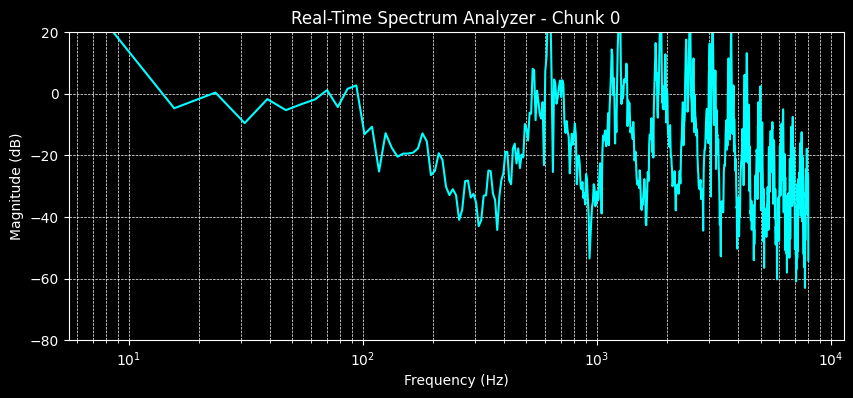

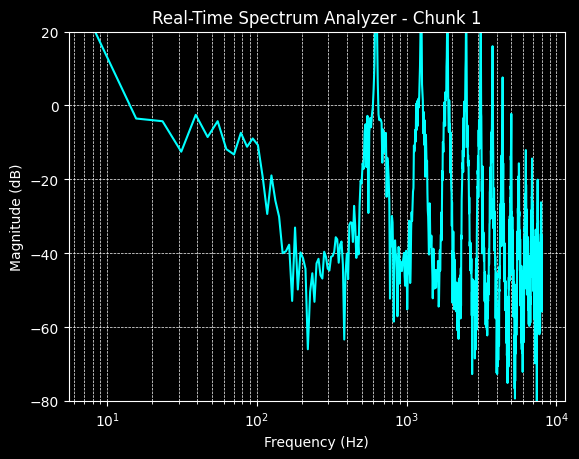

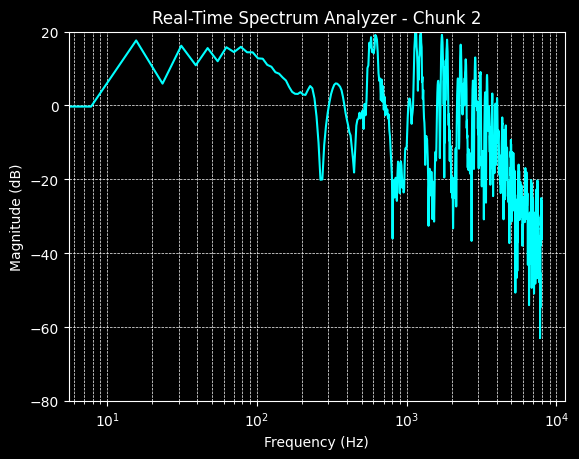

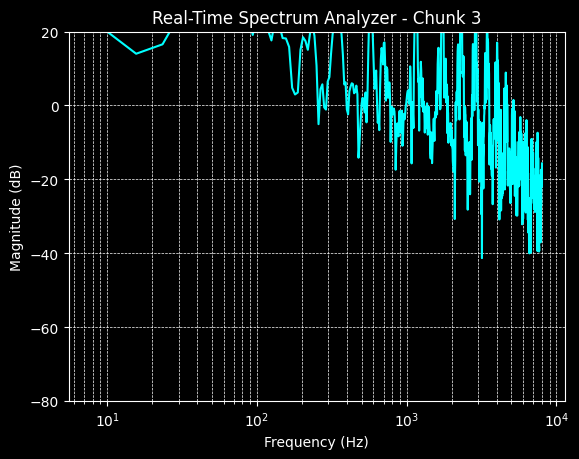

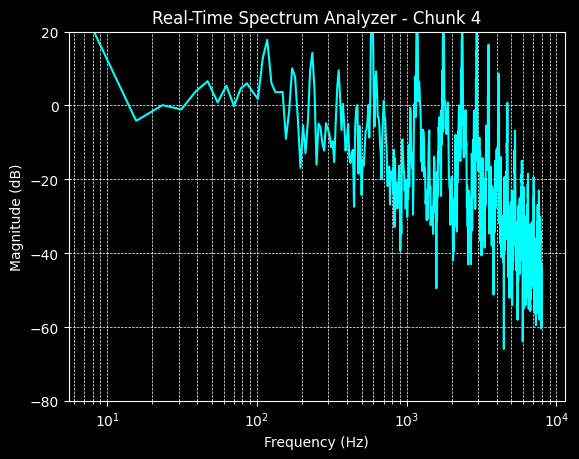

...

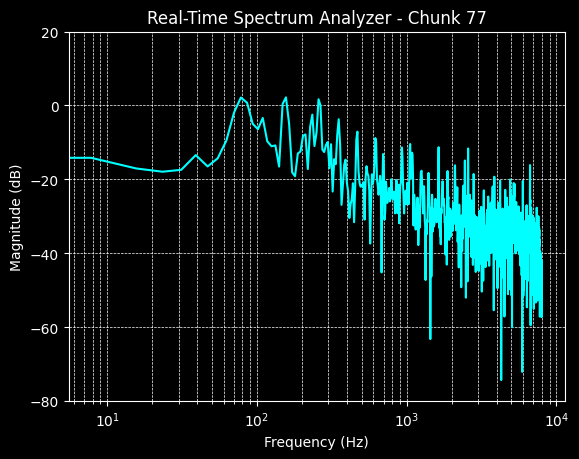

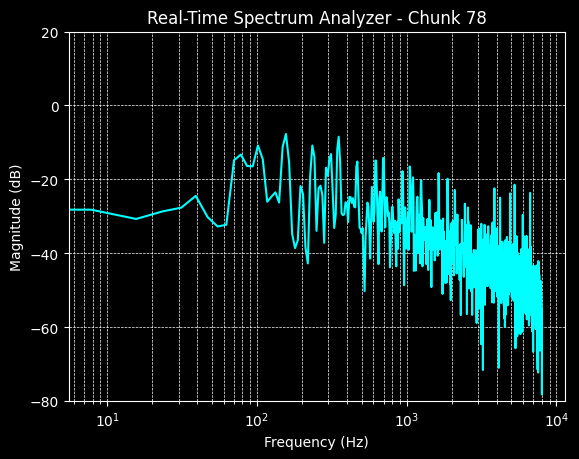

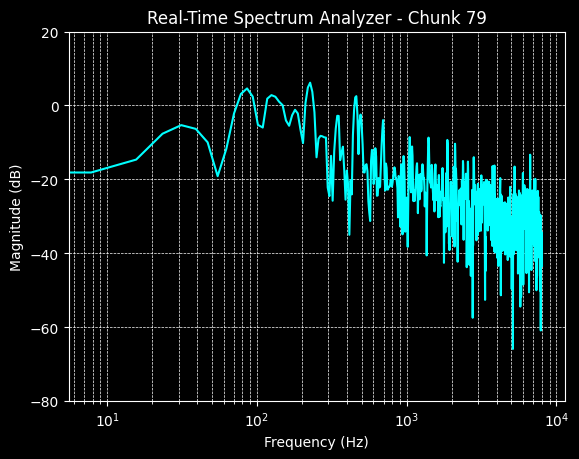

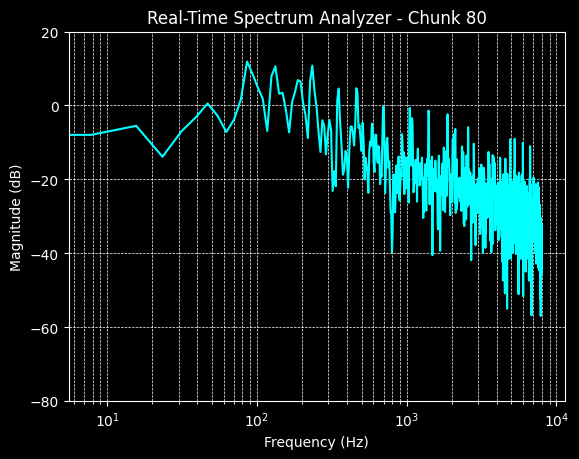

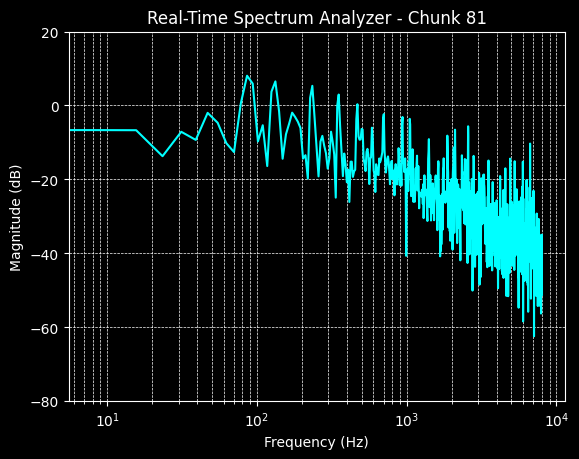

In [11]:
import numpy as np
import matplotlib.pyplot as plt
import time

def real_time_fft(signal, sr=16000, chunk_size=2048, step=1024):
    """
    Simulate real-time FFT visualization.
    Splits the signal into chunks and updates spectrum over time.
    """
    plt.figure(figsize=(10,4))

    for i in range(0, len(signal)-chunk_size, step):
        chunk = signal[i:i+chunk_size]

        # Apply window to reduce spectral leakage
        window = np.hanning(len(chunk))
        chunk = chunk * window

        # FFT and convert to dB
        fft_mag = np.abs(np.fft.rfft(chunk))
        fft_db = 20 * np.log10(fft_mag + 1e-6)   # avoid log(0)
        freqs = np.fft.rfftfreq(chunk_size, 1/sr)

        plt.clf()
        plt.semilogx(freqs, fft_db, color="cyan")
        plt.title(f"Real-Time Spectrum Analyzer - Chunk {i//step}")
        plt.xlabel("Frequency (Hz)")
        plt.ylabel("Magnitude (dB)")
        plt.ylim([-80, 20])
        plt.grid(True, which="both", ls="--", lw=0.5)
        plt.pause(0.05)  # small delay for animation

    plt.show()

# Example usage:
try:
    final_audio = morph_audio.blended_output
    real_time_fft(final_audio)
except AttributeError:
    print("Run morphing slider first.")


**Feature Space Embeddings**

/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127932 (\N{MUSICAL SCORE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


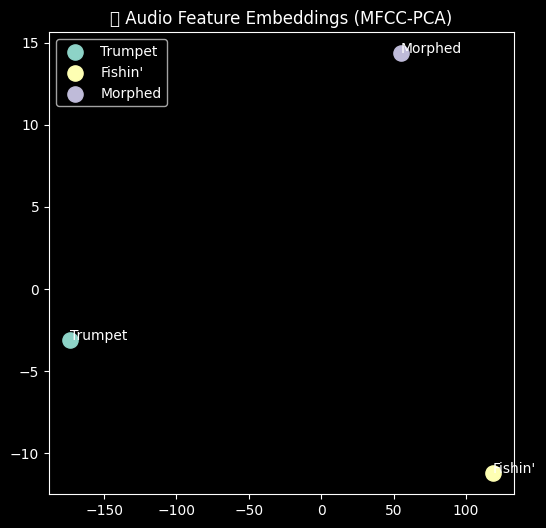

In [12]:
# ===============================================================
# 🔮 FEATURE SPACE VISUALIZATION (PCA/t-SNE on MFCCs)
# ===============================================================
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

def visualize_feature_space(audios, labels, sr=16000):
    """
    Extract MFCCs → reduce → visualize audio similarity in 2D.
    """
    features = []
    for audio in audios:
        mfcc = librosa.feature.mfcc(y=audio, sr=sr, n_mfcc=20)
        features.append(np.mean(mfcc, axis=1))
    features = np.array(features)

    reduced = PCA(n_components=2).fit_transform(features)
    plt.figure(figsize=(6,6))
    for f, label in zip(reduced, labels):
        plt.scatter(f[0], f[1], label=label, s=120)
        plt.text(f[0]+0.01, f[1]+0.01, label, fontsize=10)
    plt.title("🎼 Audio Feature Embeddings (MFCC-PCA)")
    plt.legend()
    plt.show()

try:
    final_audio = morph_audio.blended_output
    visualize_feature_space(
        [source_1, source_2, final_audio],
        ["Trumpet", "Fishin'", "Morphed"]
    )
except AttributeError:
    print("⚠️ Generate morphed output first.")


**Spectral Morphing**

/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127912 (\N{ARTIST PALETTE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


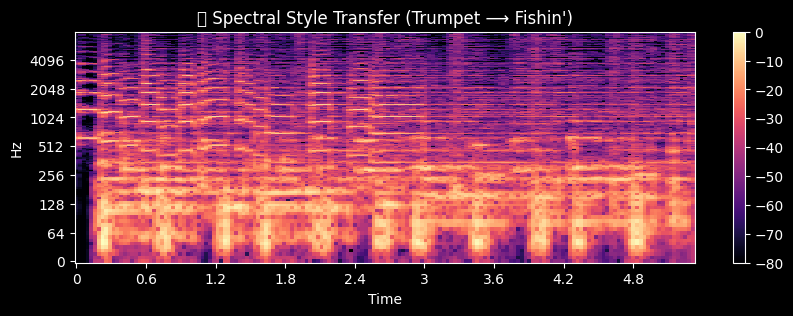

In [13]:
# ===============================================================
#  STYLE TRANSFER: Replace Spectral Envelope
# ===============================================================
def spectral_morph(source_a, source_b, sr=16000, alpha=0.5):
    """
    Replace spectral envelope of source_a with source_b partially.
    alpha=0 → pure source_a
    alpha=1 → pure source_b envelope
    """
    S_a = librosa.stft(source_a)
    S_b = librosa.stft(source_b)

    mag_a, phase_a = np.abs(S_a), np.angle(S_a)
    mag_b, _ = np.abs(S_b), np.angle(S_b)

    morphed_mag = (1-alpha)*mag_a + alpha*mag_b
    morphed = librosa.istft(morphed_mag * np.exp(1j*phase_a))
    morphed /= np.max(np.abs(morphed))
    return morphed

try:
    morphed_style = spectral_morph(source_1, source_2, alpha=0.6)
    display(Audio(morphed_style, rate=sr1))
    plt.figure(figsize=(10,3))
    librosa.display.specshow(librosa.amplitude_to_db(np.abs(librosa.stft(morphed_style)), ref=np.max),
                             sr=sr1, y_axis="log", x_axis="time")
    plt.title("🎨 Spectral Style Transfer (Trumpet ⟶ Fishin')")
    plt.colorbar()
    plt.show()
except Exception as e:
    print("⚠️ Error in style transfer:", e)


In [14]:
# ===============================================================
# 🎭 AUDIO MOOD CLASSIFIER (Energy vs. Brightness)
# ===============================================================
def classify_mood(audio, sr=16000):
    centroid = np.mean(librosa.feature.spectral_centroid(y=audio, sr=sr))
    energy = np.mean(librosa.feature.rms(y=audio))

    if centroid > 3000 and energy > 0.05:
        return " Energetic/Bright"
    elif centroid < 2000 and energy < 0.03:
        return " Calm/Warm"
    else:
        return " Neutral"

try:
    final_audio = morph_audio.blended_output
    mood = classify_mood(final_audio)
    print(f" Morphed Audio Mood: {mood}")
except AttributeError:
    print(" Run morphing first.")


 Morphed Audio Mood:  Neutral


In [15]:
# ===============================================================
# DATASET AUGMENTATION (GAN-like Variants)
# ===============================================================
def generate_variants(audio, n=5):
    """
    Generate slightly altered versions of an audio file
    for dataset augmentation.
    """
    variants = []
    for i in range(n):
        shifted = librosa.effects.pitch_shift(audio, sr=sr1, n_steps=np.random.uniform(-2,2))
        stretched = librosa.effects.time_stretch(shifted, rate=np.random.uniform(0.9,1.1))
        variants.append(stretched[:len(audio)])
    return variants

try:
    variants = generate_variants(morph_audio.blended_output, n=3)
    for i, v in enumerate(variants):
        sf.write(f"variant_{i}.wav", v, sr1)
        display(Audio(v, rate=sr1))
    print("Saved augmented audio variants.")
except AttributeError:
    print(" Run morphing first.")


Saved augmented audio variants.


**GAN Style Augmentation**

In [16]:
# ===============================================================
# 🔄 DATASET AUGMENTATION (GAN-like Variants)
# ===============================================================
def generate_variants(audio, n=5):
    """
    Generate slightly altered versions of an audio file
    for dataset augmentation.
    """
    variants = []
    for i in range(n):
        shifted = librosa.effects.pitch_shift(audio, sr=sr1, n_steps=np.random.uniform(-2,2))
        stretched = librosa.effects.time_stretch(shifted, rate=np.random.uniform(0.9,1.1))
        variants.append(stretched[:len(audio)])
    return variants

try:
    variants = generate_variants(morph_audio.blended_output, n=3)
    for i, v in enumerate(variants):
        sf.write(f"variant_{i}.wav", v, sr1)
        display(Audio(v, rate=sr1))
    print("✅ Saved augmented audio variants.")
except AttributeError:
    print("⚠️ Run morphing first.")


✅ Saved augmented audio variants.


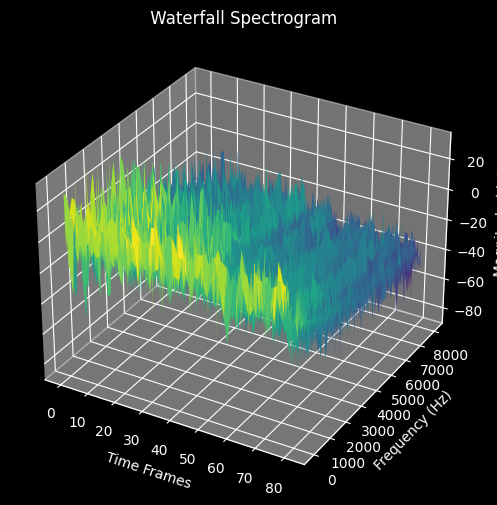

In [18]:
import matplotlib.pyplot as plt
from matplotlib import cm

def waterfall_spectrogram(signal, sr=16000, chunk_size=2048, step=1024):
    """
    Waterfall spectrogram: shows frequency vs time vs amplitude
    """
    spectrogram = []
    for i in range(0, len(signal)-chunk_size, step):
        chunk = signal[i:i+chunk_size]
        window = np.hanning(len(chunk))
        chunk = chunk * window
        fft_mag = np.abs(np.fft.rfft(chunk))
        fft_db = 20 * np.log10(fft_mag + 1e-6)
        spectrogram.append(fft_db)

    spectrogram = np.array(spectrogram).T  # transpose to freq x time

    # Plot 3D waterfall
    fig = plt.figure(figsize=(12,6))
    ax = fig.add_subplot(111, projection='3d')

    time_axis = np.arange(spectrogram.shape[1])
    freq_axis = np.fft.rfftfreq(chunk_size, 1/sr)

    T, F = np.meshgrid(time_axis, freq_axis)

    ax.plot_surface(T, F, spectrogram, cmap=cm.viridis)
    ax.set_xlabel("Time Frames")
    ax.set_ylabel("Frequency (Hz)")
    ax.set_zlabel("Magnitude (dB)")
    ax.set_title(" Waterfall Spectrogram")
    plt.show()

# Usage
try:
    final_audio = morph_audio.blended_output
    waterfall_spectrogram(final_audio)
except AttributeError:
    print("Run morphing slider first.")


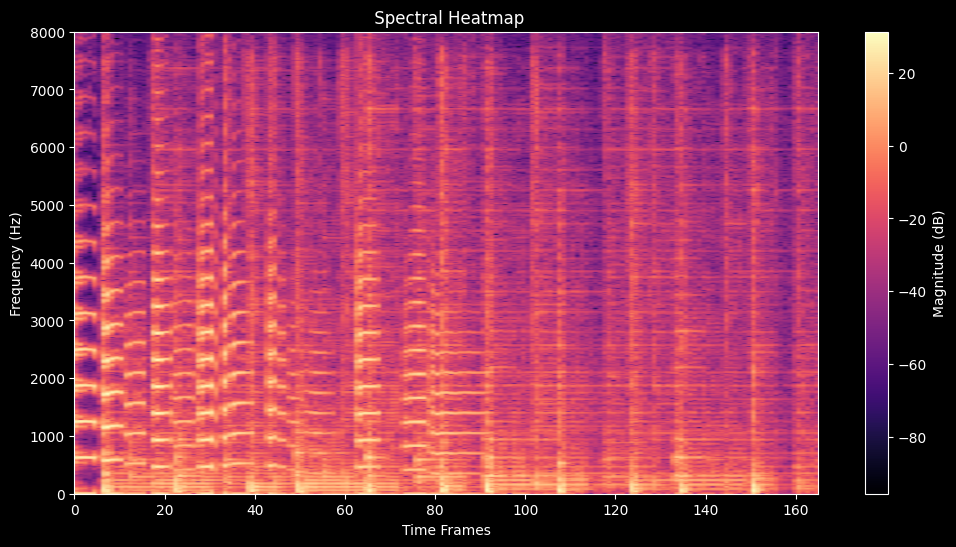

In [19]:
def spectral_heatmap(signal, sr=16000, chunk_size=1024, step=512):
    spectrogram = []
    for i in range(0, len(signal)-chunk_size, step):
        chunk = signal[i:i+chunk_size]
        window = np.hanning(len(chunk))
        chunk = chunk * window
        fft_mag = np.abs(np.fft.rfft(chunk))
        fft_db = 20 * np.log10(fft_mag + 1e-6)
        spectrogram.append(fft_db)

    spectrogram = np.array(spectrogram).T  # freq x time

    plt.figure(figsize=(12,6))
    plt.imshow(spectrogram, origin='lower', aspect='auto', cmap='magma',
               extent=[0, spectrogram.shape[1], 0, np.fft.rfftfreq(chunk_size, 1/sr)[-1]])
    plt.colorbar(label='Magnitude (dB)')
    plt.xlabel("Time Frames")
    plt.ylabel("Frequency (Hz)")
    plt.title(" Spectral Heatmap")
    plt.show()

# Usage
try:
    final_audio = morph_audio.blended_output
    spectral_heatmap(final_audio)
except AttributeError:
    print("Run morphing slider first.")


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127899 (\N{CONTROL KNOBS}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


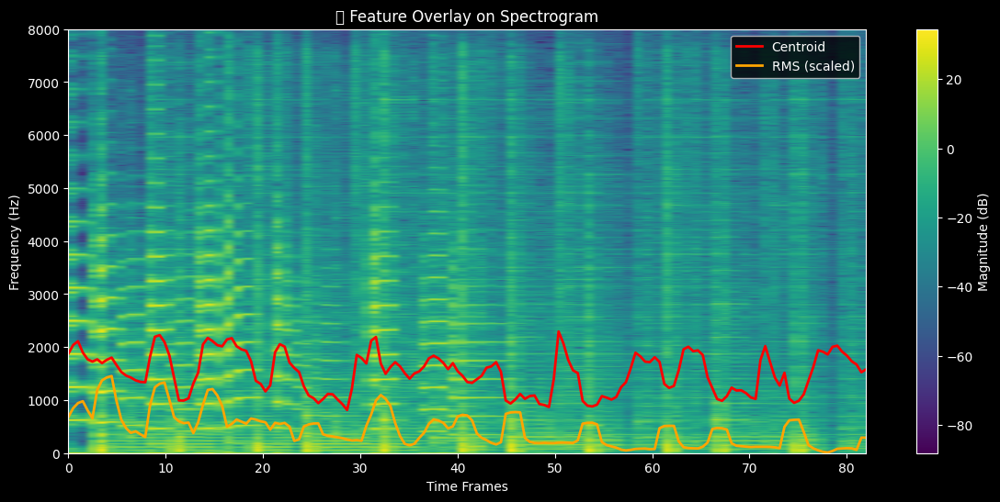

In [20]:
def feature_overlay(signal, sr=16000, chunk_size=2048, step=1024):
    # Compute spectrogram
    spectrogram = []
    for i in range(0, len(signal)-chunk_size, step):
        chunk = signal[i:i+chunk_size]
        window = np.hanning(len(chunk))
        chunk = chunk * window
        fft_mag = np.abs(np.fft.rfft(chunk))
        fft_db = 20 * np.log10(fft_mag + 1e-6)
        spectrogram.append(fft_db)
    spectrogram = np.array(spectrogram).T

    # Compute features
    centroid = librosa.feature.spectral_centroid(y=signal, sr=sr)[0]
    rms = librosa.feature.rms(y=signal)[0]

    # Plot
    plt.figure(figsize=(14,6))
    plt.imshow(spectrogram, origin='lower', aspect='auto', cmap='viridis',
               extent=[0, spectrogram.shape[1], 0, np.fft.rfftfreq(chunk_size, 1/sr)[-1]])
    plt.colorbar(label='Magnitude (dB)')

    # Overlay centroid
    plt.plot(np.linspace(0, spectrogram.shape[1], len(centroid)), centroid, color='red', lw=2, label='Centroid')
    # Overlay RMS (scaled)
    plt.plot(np.linspace(0, spectrogram.shape[1], len(rms)), rms*8000, color='orange', lw=2, label='RMS (scaled)')

    plt.xlabel("Time Frames")
    plt.ylabel("Frequency (Hz)")
    plt.title("🎛 Feature Overlay on Spectrogram")
    plt.legend()
    plt.show()

# Usage
try:
    final_audio = morph_audio.blended_output
    feature_overlay(final_audio)
except AttributeError:
    print("Run morphing slider first.")


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


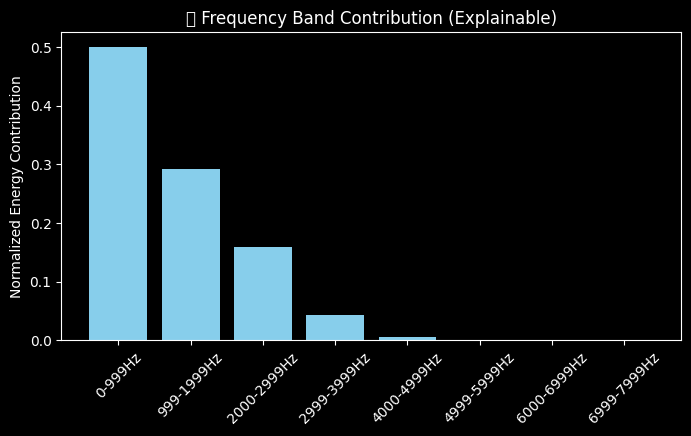

In [25]:
def frequency_contribution(signal, sr=16000, n_bands=8):
    """
    Divide the spectrum into bands and show energy contribution of each.
    """
    fft_mag = np.abs(np.fft.rfft(signal))
    freqs = np.fft.rfftfreq(len(signal), 1/sr)

    # Divide frequency range into bands
    band_edges = np.linspace(0, len(fft_mag), n_bands+1, dtype=int)
    band_energy = []
    for i in range(n_bands):
        energy = np.sum(fft_mag[band_edges[i]:band_edges[i+1]]**2)
        band_energy.append(energy)

    band_energy = np.array(band_energy)
    band_energy = band_energy / np.sum(band_energy)  # normalize

    # Plot as explainable bar chart
    plt.figure(figsize=(8,4))
    plt.bar(range(n_bands), band_energy, color='skyblue')
    plt.xticks(range(n_bands), [f"{int(freqs[band_edges[i]]):.0f}-{int(freqs[band_edges[i+1]-1]):.0f}Hz"
                                for i in range(n_bands)], rotation=45)
    plt.ylabel("Normalized Energy Contribution")
    plt.title("🔍 Frequency Band Contribution (Explainable)")
    plt.show()

    return band_energy

# Usage
try:
    final_audio = morph_audio.blended_output
    contributions = frequency_contribution(final_audio)
except AttributeError:
    print("Run morphing first.")

In [28]:
# ===============================================================
# INTERACTIVE RESEARCH-GRADE AUDIO MORPHING + XAI DASHBOARD
# ===============================================================
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display
from IPython.display import Audio, display, clear_output
from ipywidgets import interact, FloatSlider, Dropdown, Layout
from scipy.signal import hilbert

# === Make sure source_1, source_2, env1, env2 are already defined ===
# For example, after your morphing code:
# source_1, sr1 = librosa.load(librosa.example('trumpet'), sr=16000)
# source_2, sr2 = librosa.load(librosa.example('fishin'), sr=16000)
# env1 = np.abs(hilbert(source_1)); env1 /= np.max(env1)
# env2 = np.abs(hilbert(source_2)); env2 /= np.max(env2)
# Ensure they are same length
duration = min(len(source_1), len(source_2))
source_1, source_2 = source_1[:duration], source_2[:duration]
env1, env2 = env1[:duration], env2[:duration]

# ------------------------------
# Helper: Morph Curve
# ------------------------------
def get_morph_curve(duration, curve_type='sine'):
    t = np.linspace(0, 1, duration)
    if curve_type == 'linear':
        return t
    elif curve_type == 'exponential':
        return t**2
    elif curve_type == 'logarithmic':
        return np.log1p(t * np.e) / np.log1p(np.e)
    elif curve_type == 'step':
        return np.where(t < 0.5, 0, 1)
    else:
        return 0.5 + 0.5 * np.sin(2 * np.pi * 0.5 * t)

# ------------------------------
# 1️⃣ Frequency Band Contribution
# ------------------------------
def frequency_contribution(signal, sr=16000, n_bands=8):
    fft_mag = np.abs(np.fft.rfft(signal))
    freqs = np.fft.rfftfreq(len(signal), 1/sr)

    band_edges = np.linspace(0, len(fft_mag)-1, n_bands+1, dtype=int)
    band_energy = []
    for i in range(n_bands):
        energy = np.sum(fft_mag[band_edges[i]:band_edges[i+1]]**2)
        band_energy.append(energy)

    band_energy = np.array(band_energy)
    band_energy /= np.sum(band_energy)

    plt.figure(figsize=(8,3))
    plt.bar(range(n_bands), band_energy, color='skyblue')
    plt.xticks(range(n_bands),
               [f"{int(freqs[band_edges[i]]):.0f}-{int(freqs[min(band_edges[i+1], len(freqs)-1)]):.0f}Hz"
                for i in range(n_bands)], rotation=45)
    plt.ylabel("Normalized Energy")
    plt.title("🔍 Frequency Band Contribution")
    plt.show()

# ------------------------------
# 2️⃣ Top Frequencies
# ------------------------------
def top_frequencies(signal, sr=16000, top_n=5):
    fft_mag = np.abs(np.fft.rfft(signal))
    freqs = np.fft.rfftfreq(len(signal), 1/sr)
    idx = np.argsort(fft_mag)[-top_n:]
    print("Top frequencies (Hz):", freqs[idx])
    print("Magnitudes:", fft_mag[idx])

# ------------------------------
# 3️⃣ Energy Flow
# ------------------------------
def energy_flow(source1, source2, factor=0.5, curve_type='sine'):
    env1_local = np.abs(hilbert(source1))
    env1_local /= np.max(env1_local)

    env2_local = np.abs(hilbert(source2))
    env2_local /= np.max(env2_local)

    morph_curve = get_morph_curve(len(source1), curve_type)
    e1 = env1_local * (1 - morph_curve*factor)
    e2 = env2_local * (morph_curve*factor)

    plt.figure(figsize=(12,2))
    plt.plot(e1, label='Source 1', color='orange')
    plt.plot(e2, label='Source 2', color='cyan')
    plt.title("🔄 Energy Flow Between Sources")
    plt.xlabel("Sample Index")
    plt.ylabel("Normalized Energy")
    plt.legend()
    plt.show()

# ------------------------------
# 4️⃣ Spectral Overlay
# ------------------------------
def spectral_xai_overlay(signal, sr=16000):
    S = np.abs(librosa.stft(signal))
    S_db = librosa.amplitude_to_db(S, ref=np.max)

    centroid = librosa.feature.spectral_centroid(y=signal, sr=sr)[0]
    bandwidth = librosa.feature.spectral_bandwidth(y=signal, sr=sr)[0]

    plt.figure(figsize=(12,4))
    librosa.display.specshow(S_db, sr=sr, y_axis='log', x_axis='time', cmap='magma')
    plt.plot(np.linspace(0, S_db.shape[1], len(centroid)), centroid, color='cyan', lw=2, label='Centroid')
    plt.plot(np.linspace(0, S_db.shape[1], len(bandwidth)), bandwidth, color='lime', lw=2, label='Bandwidth')
    plt.colorbar(label='Magnitude (dB)')
    plt.title("🔍 Spectral XAI Overlay: Centroid & Bandwidth")
    plt.legend()
    plt.show()

# ------------------------------
# 5️⃣ Morph Curve Influence
# ------------------------------
def curve_influence_analysis(factor=0.5):
    curves = ['linear', 'exponential', 'logarithmic', 'step', 'sine']
    energies = []

    for curve in curves:
        morph_curve = get_morph_curve(len(source_1), curve)
        blended = source_1 * env1 * (1 - morph_curve * factor) + source_2 * env2 * (morph_curve * factor)
        blended /= np.max(np.abs(blended))
        energies.append(np.mean(np.abs(blended)))

    plt.figure(figsize=(6,3))
    plt.bar(curves, energies, color='orchid')
    plt.ylabel("Mean Absolute Amplitude")
    plt.title("📊 Morph Curve Influence")
    plt.show()

# ------------------------------
# 6️⃣ Full Interactive Dashboard
# ------------------------------
def interactive_xai(factor=0.5, curve_type='sine'):
    morph_curve = get_morph_curve(len(source_1), curve_type)
    blended = source_1 * env1 * (1 - morph_curve * factor) + source_2 * env2 * (morph_curve * factor)
    blended /= np.max(np.abs(blended))

    clear_output(wait=True)
    display(Audio(blended, rate=16000))  # Play morphed audio

    # Show visualizations
    plt.figure(figsize=(12,2))
    plt.plot(blended[:5000], color='crimson')
    plt.title("🎶 Morphed Waveform (First 5000 samples)")
    plt.show()

    frequency_contribution(blended)
    top_frequencies(blended)
    energy_flow(source_1, source_2, factor, curve_type)
    spectral_xai_overlay(blended)
    curve_influence_analysis(factor)

# ------------------------------
# Launch Interactive Dashboard
# ------------------------------
interact(
    interactive_xai,
    factor=FloatSlider(min=0.0, max=1.0, step=0.01, value=0.5, description='Morph Level',
                       style={'description_width': 'initial'}, layout=Layout(width='400px')),
    curve_type=Dropdown(options=['linear', 'exponential', 'logarithmic', 'step', 'sine'], value='sine',
                        description='Blend Curve', style={'description_width': 'initial'}, layout=Layout(width='300px'))
)


interactive(children=(FloatSlider(value=0.5, description='Morph Level', layout=Layout(width='400px'), max=1.0,…

<function __main__.interactive_xai(factor=0.5, curve_type='sine')>